In [ ]:
!ls "drive/MyDrive/Dog Vision/"


dog-breed-identification  dog-breed-identification.zip	__MACOSX


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"


Archive:  /content/drive/MyDrive/Dog Vision/dog-breed-identification.zip
replace /content/drive/MyDrive/Dog Vision/__MACOSX/._dog-breed-identification? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/drive/MyDrive/Dog Vision/__MACOSX/dog-breed-identification/._labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 87.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 62.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninstalling wrapt-1.17.0:
      Successfully uninstalled wrapt-1.17.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes

# End-to-end Multil-class Dog Breed Classification
This notebook build an end-to-end image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem
Identifiying the breed of a dog given an image of a dog
when i am sitting at the cafe and i take a photo of a dog it is.

## 2. Data
We are using is from Kaggle 's dog breed identification comptition.

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some information about the data:
* We're dealing with image(unstructured data)so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs (it means there are 120 different classed)
* There are around 10000+ images in the training set(these images have lables) and test set ( these images have no labels, because we'll want to predict them)


### Get our workspace ready
* Import Tensorflow
* import Tensorflow Hub
* Make sure we're using GPU

In [ ]:
# Import tensorflow into colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [ ]:
#import necessary tools
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

#Check for GPU availability
print("GPU", "available(YES!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF Hub version: 0.16.1
GPU available(YES!!!!!!)


## Getting our data ready (tuning into Tensors)

With all machine learning models , our data has to be in numerical format.So that's what we'll be doing first. Turning our images into Tensors (numerical representations)

In [ ]:
#Checkout the lables of our data
import pandas as pd
labels_csv= pd.read_csv("/content/drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

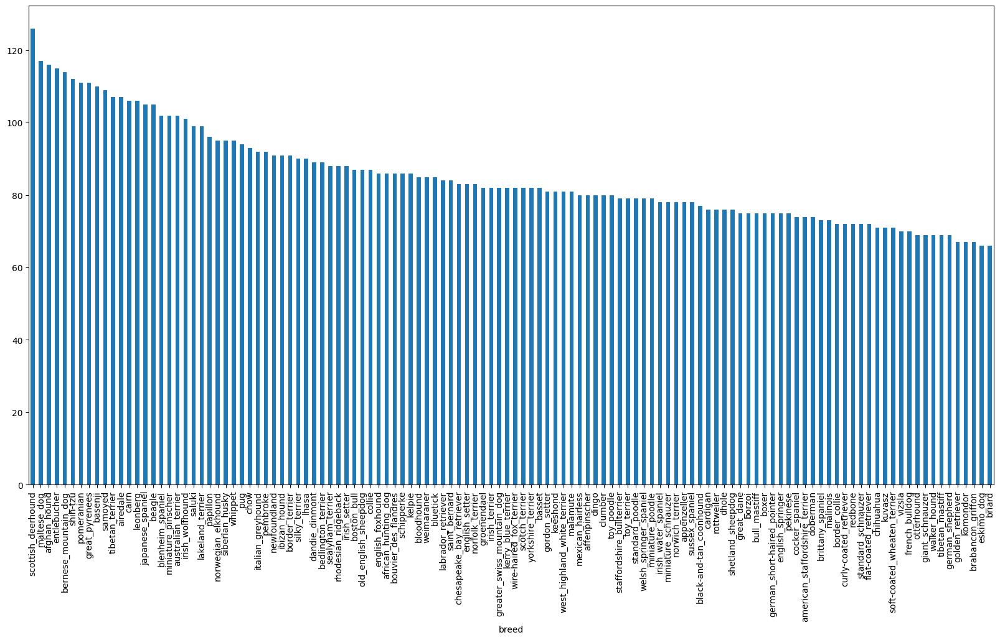

In [ ]:
# how many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))


In [ ]:
labels_csv["breed"].value_counts().median()

82.0

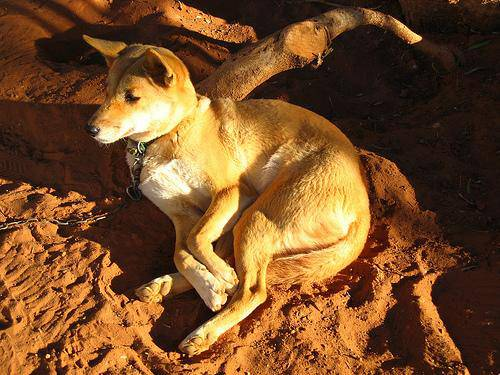

In [ ]:
#Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all our images pathnames

In [ ]:
labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from image ID's
filenames=["/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#check the first 10
filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-

In [ ]:
import os
os.listdir("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/")[:10]

['e278e285726d3ec4b737d80cc891d266.jpg',
 'e2dd7700aa63c7982130ec9087086bbb.jpg',
 'e36cf92886e752cdd8be2101b3090a2c.jpg',
 'dd826e6990638acaff24142f0d4b0b4b.jpg',
 'e7ab11f849e895ced3cdddf4d90e5bd2.jpg',
 'dbb4eaefd7d8c11637d1ee5c2c819427.jpg',
 'dbde111456535431c6caedfa5b8c8dea.jpg',
 'e79011daac807552f798aa1effb60ee4.jpg',
 'e73d792517b5e717709ed11782adddf8.jpg',
 'e7678fac0b8f1d97e742644ee75a8aa2.jpg']

In [ ]:
#check whether number of filenames matches number of actual image files

if len(os.listdir("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/"))==len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


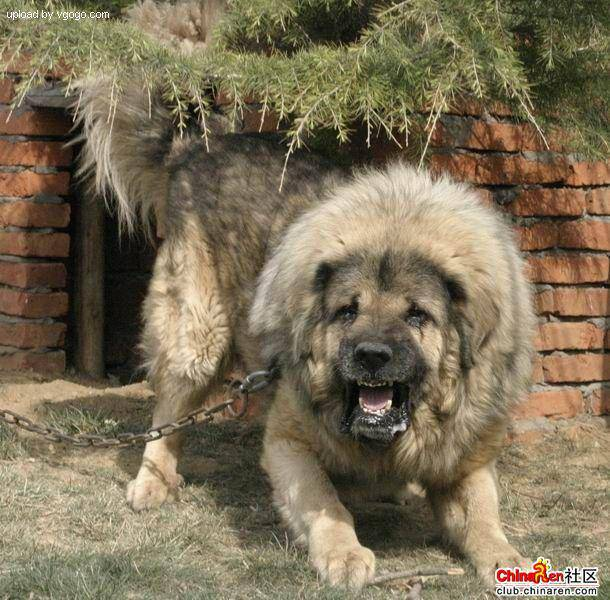

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list let's prepare our labels

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# see if number of labels matches the number of filenames
if len(labels)==len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames, check data directories")

Number of labels matches number of filenames


In [ ]:
#find the unique lable values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels=[label== unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Create our own validation set
Since the dataset from kaggle doesn't come with a validation set , we're going to create our own.

In [ ]:
#setup x and y variables
x = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with 1000 images and increase as needed

In [ ]:
#set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:1000, step:1000}

In [ ]:
#let's split out data into train and validation sets
from sklearn.model_selection import train_test_split

#split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
#let's have a geez at the trianing data
x_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fa

## Preprocessing images ( turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use "Tensorflow" to read the file and save it to a variable ,'image'
3. Turn our 'image'(a jpg) into Tensors
4. Normalize our image (convert color channels values from 1-255 to 0-1)
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified 'image'

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocessor

In [ ]:

# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image file path and turns it into a Tensor.
    """
    # Read in the image file
    image = tf.io.read_file(image_path)

    # Decode the JPEG image into a numerical Tensor with 3 color channels (RGB)
    image = tf.image.decode_jpeg(image, channels=3)  # Use decode_png if your images are PNGs

    # Convert the color channel values from 0-255 to 0-1 (normalization)
    image = tf.image.convert_image_dtype(image, tf.float32)

    # Resize the image to the desired size (224x224)
    image = tf.image.resize(image, size=[img_size, img_size])

    return image


## Turning our data into batches

Why turn our data into batches?

Let's say we are trying to process 10,000+ images in onse go...they all might not fit memory

So that's why we do aout 32 (batch size ) images at a time

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
"(image, label)"

In [ ]:
# create a simple function to return a tupe(image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a type of (image,label)
  """
  image = process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuples of Tensors in the form: "(image, labels)" Let's make a function to turn all of our data into batches

In [ ]:
# Define the batch size , 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but diesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a validation dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepatch and lables into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data_batch = data.shuffle(buffer_size=len(x)).map(get_image_label).batch(BATCH_SIZE)
    return data_batch


In [ ]:
# create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# check out the different attributes of our data bathces
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend , let's visualiza them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # setup the figure
  plt.figure(figsize=(10, 10))
  #loop through 25
  for i in range(25):
    #create subplots ( 5 rows, 5 columns)
    ax=plt.subplot(5, 5, i+1)
    #display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


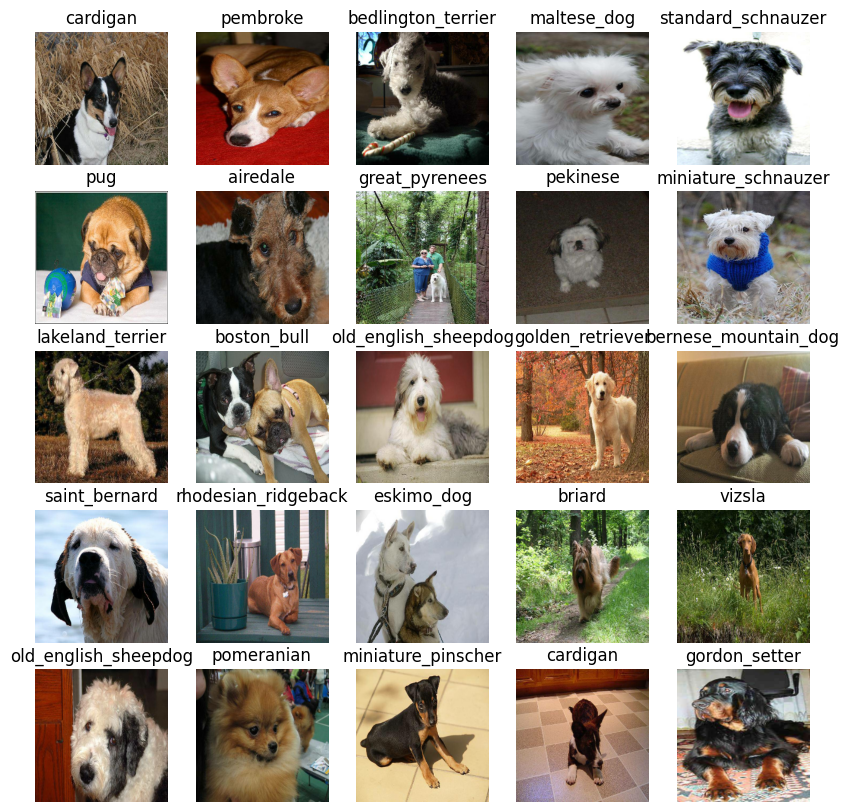

In [ ]:
# Now visualize the shuffled batch of data
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

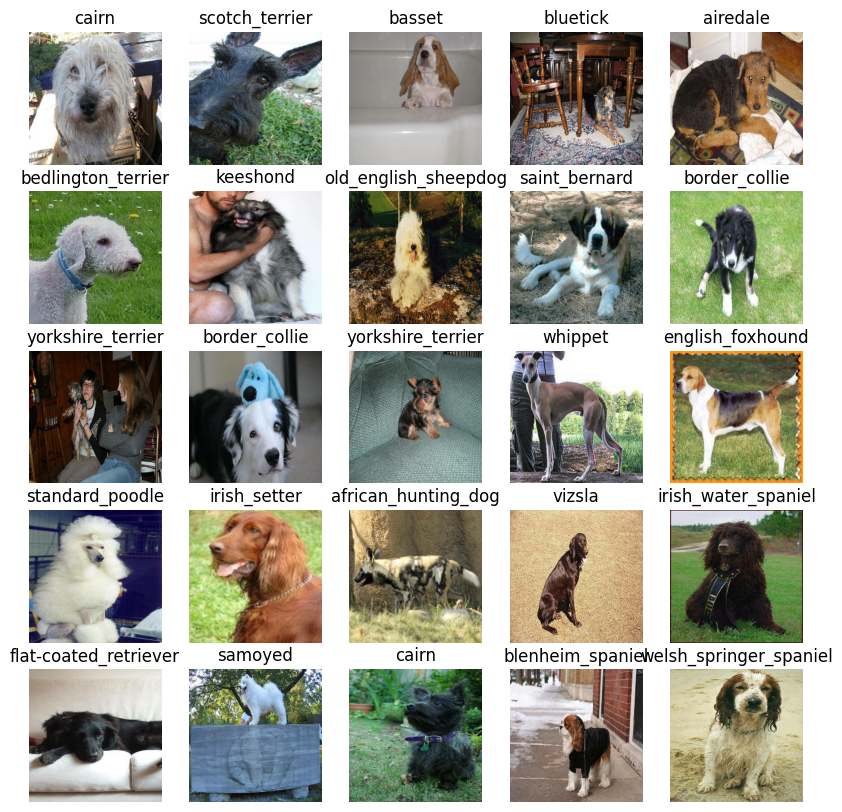

In [ ]:
# visualzie validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape , in the form of Tensors) to our model.
* The output shape (image labels , in the form of Tensors) of our model.
* The URL of the model we want to use

In [ ]:
import keras
from keras.layers import Dense
import tensorflow as tf
import tensorflow_hub as hub
import tf_keras

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup MODEL URL from TensorflOW hUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
OUTPUT_SHAPE

120

Now we've got our inputs and model ready to go. Let's put together into a Keras deep learning model. Let's create a function:
* Takes the input shape , output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this , then that)
* Compiles the model (says it should be evaluated and improved)
* Build the model (tells model the input shape it'll be getting)
* Return the model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

import requests
from PIL import Image
from io import BytesIO

import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# create function which builds Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (output layer)
  ])

  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbakcs are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for TensorBoard which helps tracjk our models progress and another for early stopping which prevents our model from training for too long

### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's "fit()" function.
3. Visualize our models training logs with the "%tensorboard" magic function (we will do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a  TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops

In [ ]:
# Creare early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (ona subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# check to make sure we are using still a GPU
print("GPU", "available(YES!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available(YES!!!!!!)


Let's create a function which trains a model
* Create a model using "create_model()"
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data , number of epochs to train for (num_epochs) and the callbacks we'w like to use
* Return the model

In [ ]:
# Build a function to train and return a trianed model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 367s 15s/step - loss: 4.6412 - accuracy: 0.0913 - val_loss: 3.4718 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 4s 162ms/step - loss: 1.6719 - accuracy: 0.6637 - val_loss: 2.1390 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 4s 176ms/step - loss: 0.5734 - accuracy: 0.9262 - val_loss: 1.6937 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 4s 145ms/step - loss: 0.2539 - accuracy: 0.9900 - val_loss: 1.4721 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 4s 140ms/step - loss: 0.1484 - accuracy: 0.9987 - val_loss: 1.4011 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 5s 185ms/step - loss: 0.1011 - accuracy: 1.0000 - val_loss: 1.3609 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard Logs

The TensorBoard magic functions will acces the logs directory we created and visualzie its context

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make a prediction on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 108ms/step


array([[6.04978809e-03, 1.55116912e-04, 1.68077543e-03, ...,
        5.86912385e-04, 8.23919327e-05, 7.01049715e-03],
       [3.83521547e-04, 9.95828523e-05, 1.06281852e-02, ...,
        8.08822690e-04, 2.46123248e-03, 3.37546138e-04],
       [1.04974635e-04, 7.42626784e-04, 6.44321379e-04, ...,
        3.97542841e-04, 3.18483188e-04, 1.13470771e-03],
       ...,
       [2.84186126e-06, 7.21904144e-05, 1.33115507e-04, ...,
        5.16273576e-05, 3.06302740e-04, 1.41372031e-04],
       [1.88386475e-03, 1.73745910e-04, 3.66352724e-05, ...,
        2.67949654e-04, 5.85598573e-05, 1.03059225e-02],
       [1.12050865e-03, 9.81163248e-06, 1.96530181e-03, ...,
        3.70205590e-03, 3.53138638e-03, 2.84572190e-04]], dtype=float32)

In [ ]:
predictions[0]

array([6.04978809e-03, 1.55116912e-04, 1.68077543e-03, 2.12420477e-04,
       9.16529563e-04, 5.30280668e-05, 1.19232181e-02, 1.99274183e-03,
       5.88807627e-04, 4.35109483e-03, 6.69855508e-04, 4.91421320e-04,
       3.82188999e-04, 3.66475324e-05, 2.40940158e-03, 1.13456510e-03,
       9.58836245e-05, 9.41619277e-02, 2.86012873e-05, 2.55233346e-04,
       2.53272220e-03, 6.50100585e-04, 5.26702479e-06, 2.10659625e-03,
       1.61741453e-04, 2.53188045e-04, 1.02256775e-01, 1.53533576e-04,
       4.75645065e-04, 4.18717187e-04, 1.22118712e-04, 1.20438179e-02,
       1.51947679e-04, 3.56694887e-04, 1.83301716e-04, 1.10630775e-02,
       2.54079379e-04, 1.43289726e-04, 2.91252916e-04, 2.44121344e-04,
       2.58808024e-03, 2.48853721e-05, 4.31301451e-05, 3.24733934e-04,
       8.33637023e-05, 7.48855819e-04, 2.51939891e-05, 7.47415688e-05,
       9.51531518e-04, 4.55398294e-05, 2.80967215e-04, 3.35538680e-05,
       4.11303161e-04, 4.09426611e-05, 4.42320161e-05, 6.60731212e-06,
      

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index (predicted class): {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.04978809e-03 1.55116912e-04 1.68077543e-03 2.12420477e-04
 9.16529563e-04 5.30280668e-05 1.19232181e-02 1.99274183e-03
 5.88807627e-04 4.35109483e-03 6.69855508e-04 4.91421320e-04
 3.82188999e-04 3.66475324e-05 2.40940158e-03 1.13456510e-03
 9.58836245e-05 9.41619277e-02 2.86012873e-05 2.55233346e-04
 2.53272220e-03 6.50100585e-04 5.26702479e-06 2.10659625e-03
 1.61741453e-04 2.53188045e-04 1.02256775e-01 1.53533576e-04
 4.75645065e-04 4.18717187e-04 1.22118712e-04 1.20438179e-02
 1.51947679e-04 3.56694887e-04 1.83301716e-04 1.10630775e-02
 2.54079379e-04 1.43289726e-04 2.91252916e-04 2.44121344e-04
 2.58808024e-03 2.48853721e-05 4.31301451e-05 3.24733934e-04
 8.33637023e-05 7.48855819e-04 2.51939891e-05 7.47415688e-05
 9.51531518e-04 4.55398294e-05 2.80967215e-04 3.35538680e-05
 4.11303161e-04 4.09426611e-05 4.42320161e-05 6.60731212e-06
 1.02375553e-03 3.89406784e-03 3.38505284e-04 2.53944963e-01
 2.06007360e-04 5.45330513e-05 7.94771651e-04 6.71074202e-04
 1.05322886e-03 1.131946

Having the above functionality is great but we want to be able to do it at scale
And it would be even better if we could see the image the prediction is being model on!

* Note: Prediction probabilities are also known as confidence levels.

In [ ]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81]) # This line should be outside the function
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatchify to make predictions on the validation images and then comapre those predictions to the validation labels(truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify teh validation
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:
* Prediction label
* Validation labels
* Validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the color of tht title depending if prediction is correct or not
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted , probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)


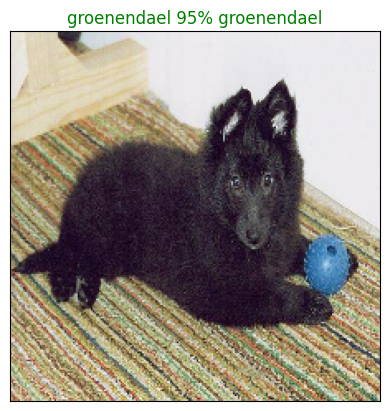

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have got one function to visualize our models top prediction, let's make another to view our models top 10 predcitions:

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10 (pred prob indexes, pred prob values and pred labels)
* Plot the top 10 prediction values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  #change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

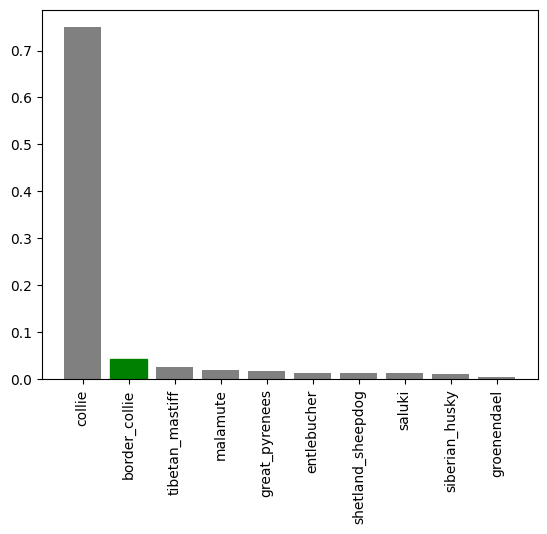

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

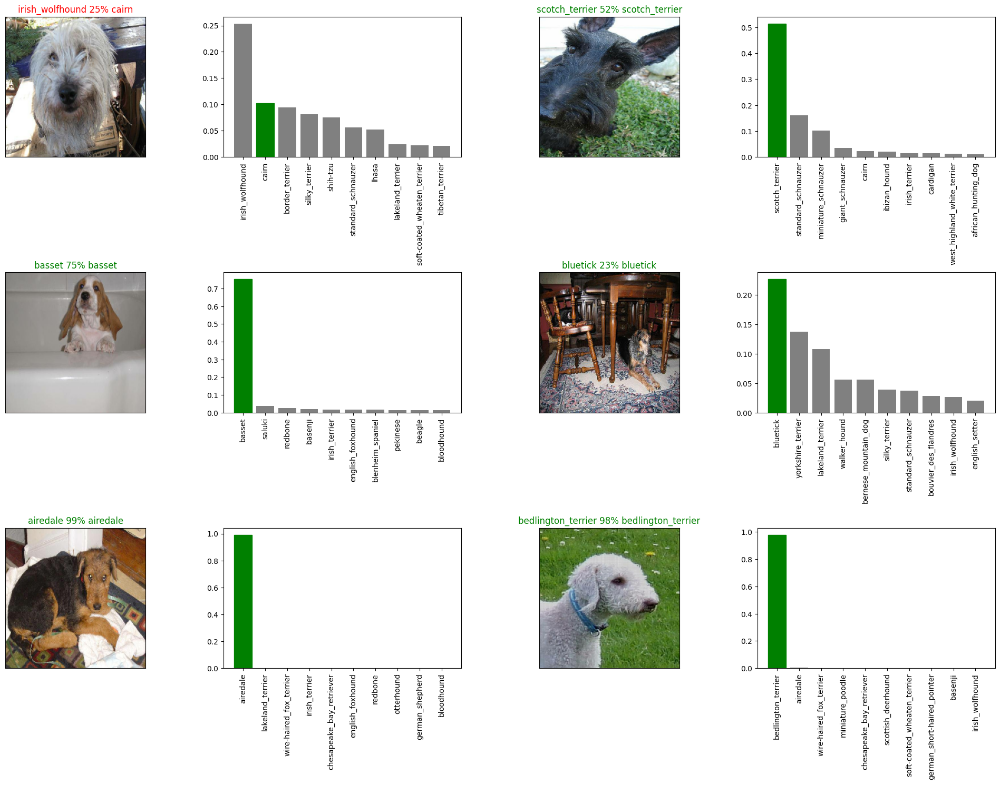

In [ ]:
i_multiplier = 0
num_rows = 3  # Set the number of rows to 2 for horizontal layout
num_cols = 2  # Set the number of columns to 3 to match the desired horizontal plots
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))  # Adjust the size of the figure accordingly

for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)  # Change the subplot configuration
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)  # Adjust for the second plot in the pair
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model


In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for separating models from each other.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                       custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work


In [ ]:
# Save a model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20250106-03141736133269-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250106-03141736133269-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20250106-03141736133269-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20250106-03141736133269-1000-images-mobilenetv2-Adam.h5


In [ ]:
#Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.2707 - accuracy: 0.6750


[1.2706522941589355, 0.675000011920929]

In [ ]:
#evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 101ms/step - loss: 1.2707 - accuracy: 0.6750


[1.2706522941589355, 0.675000011920929]

## Training a big dog model (on full data)

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data=create_data_batches(x, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
#No validation set when training on all the data , so we cannot monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])


Epoch 1/100
249/320 [======================>.......] - ETA: 13:31 - loss: 1.5324 - accuracy: 0.6329

KeyboardInterrupt: 

In [ ]:
#save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
#Load in full model
#loaded_full_model = load_model (""drive/MyDrive/Dog Vision/models/-------full-image-set-mobilenetv2-Adam.h5"")

## Making predictions on test dataset


In [ ]:
#test_path="/content/drive/MyDrive/Dog Vision/dog-breed-identification/test"
#test_filenames=[test_path + fname for fname in os.listdir(test_path)]
#test_filenames[:10]

In [ ]:
#Create test data batch
#test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
#test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
#Save predictions (NumPy array) to csv file
#np.savetxt("drive/MyDrive/Dog Vision/test_predictions.csv", test_predictions, delimiter=",")

In [ ]:
#Load predictions (NumPy array) from csv file
#test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/test_predictions.csv", delimiter=",")

## Preparing test dataset predcitions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DatafRame with an ID and a column for each different dog breed.
To get data in thsi format , we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting test image  ID's from their filepathc
* Add data (prediction probabilities) to each of the dog breed column
* Export the DataFrame as a CSV to submit it

In [ ]:
# Create apandas DataFrame with empty columsn
#preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
#preds_df.head()

In [ ]:
#Append test image ID's to predictions DataFrame
#test_ids=[os.path.splitext(fname)[0] for fname in os.listdir(test_path)]
#pred_df["id"]=test_ids

In [ ]:
#Add the prediction probbailities to each dog breed
#preds_df[list(unique_breeds)] = test_predictions


In [ ]:
#Save our predicted model for submission
#preds_df.to_csv("drive/MyDrive/Dog vision/full_model_predictions_submission_1_mobilenetV2.csv",
#index=False)

## Making predictions on custome images

To make predictions on custom images


In [ ]:
#Get custome image filepath
#custom_path="drive...."
#custome_image_paths=[custome_path + fname for fname in os.listdir(custom_path)]

In [ ]:
#Turn custome images into batches
#custom_data=create_data_batches(custom_image_paths, test_data=True)
#custom_data

In [ ]:
#Make predictions on the custom data
#custom_pred = loaded_full_model.predict(custom_data)

In [ ]:
#Get custom image prediction label
#custom_pred_label=[get_pred_label(custom_pred[i]) for i in range(len(custom_pred))]
#custom_pred_labels

In [ ]:
#custom_image=[]
#for image in custom_data.unbatch().as_numpy_iterator():
 # custom_image.append(image)

In [ ]:
# check custom images predictions
#plt.figure(figsize=(10, 10))
#for i in enumerate(custom_images):
 # plt.subplot(1, 3, i+1)
 # plt.xticks([])
  #plt.yticks([])
 # plt.title(custom_pred_labels[i])
 # plt.imshow(custom_image[i])